# Demonstration of SFILES 2.0 &harr; flowsheet graph conversion

### Example 1

In [32]:
#!pip install scipy
# !pip show networkx
# !pip install fa2



In [33]:
# !pip install networkx

In [34]:
# !pip install fa2

In [35]:
#!pip install matplotlib==3.4.3

In [36]:
# !pip show scipy

In [37]:
#!pip uninstall scipy

In [38]:
#!pip install scipy==1.7.1


In [39]:
#!pip install SFILES2

In [40]:
#%pip install nxaddons


In [41]:
#!pip show SFILES2

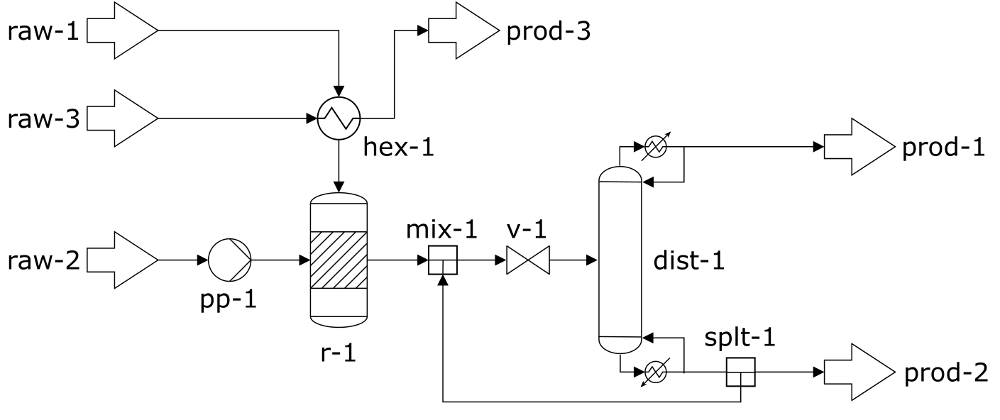

In [42]:
from IPython.display import Image

Image(filename="examples/Flowsheet_theory-1.png") 

How to create graph: 
- add all unit operations as nodes with numbered name (refer to standardized names in paper)
- add all stream connections as edges. ('labels' is optional, 'tags' should be used as described in paper).   
Format:  ('node-1', 'node-2', {'labels': 'streamlabel', 'tags':{'col': [<'tout','tin','bout','bin'>], 'he': [<'x_in','x_out'>]}})

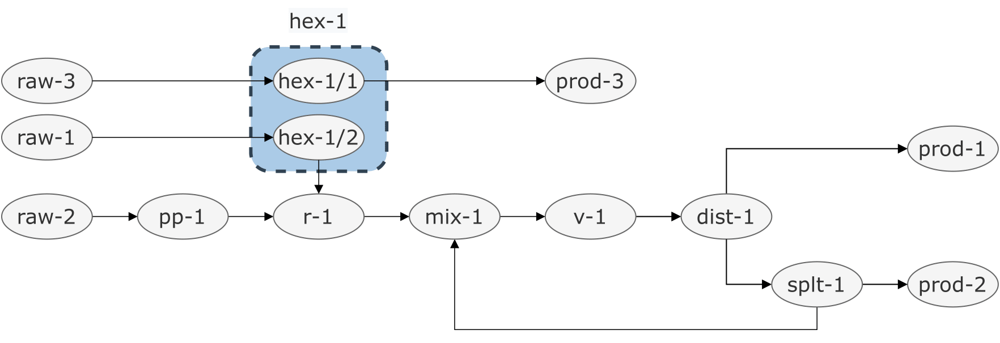

In [43]:
# How the graph should look like in theory:
Image(filename="examples/graph_theory-1.png") 

In [44]:
# How to construct graph with code:
import networkx as nx

G = nx.DiGraph()
G.add_nodes_from([
    "raw-1", "raw-2", "hex-1", "pp-1", "r-1", "mix-1", "v-1", 
    "dist-1", "splt-1", "prod-1", "prod-2", "prod-3", "raw-3"
    ])
G.add_edges_from([
    ("raw-1", "hex-1",{"labels": "", "tags":{"he": ["1_in"]}}),
    ("hex-1", "r-1", {"labels": "", "tags":{"he": ["1_out"]}}), 
    ("raw-2", "pp-1"), ("pp-1", "r-1"), ("r-1", "mix-1"), ("mix-1", "v-1"), ("v-1", "dist-1"),
    ("dist-1", "prod-1", {"tags":{"col": ["tout"]}}),
    ("dist-1", "splt-1", {"tags":{"col": ["bout"]}}), 
    ("splt-1","mix-1"), ("splt-1", "prod-2"), 
    ("raw-3", "hex-1",{"labels": "", "tags":{"he": ["2_in"]}}), 
    ("hex-1", "prod-3",{"labels": "", "tags":{"he": ["2_out"]}})
    ])

Number of unit operations = 13
Number of controllers = 0
Number of indicators = 0 
Number of transmitters = 0


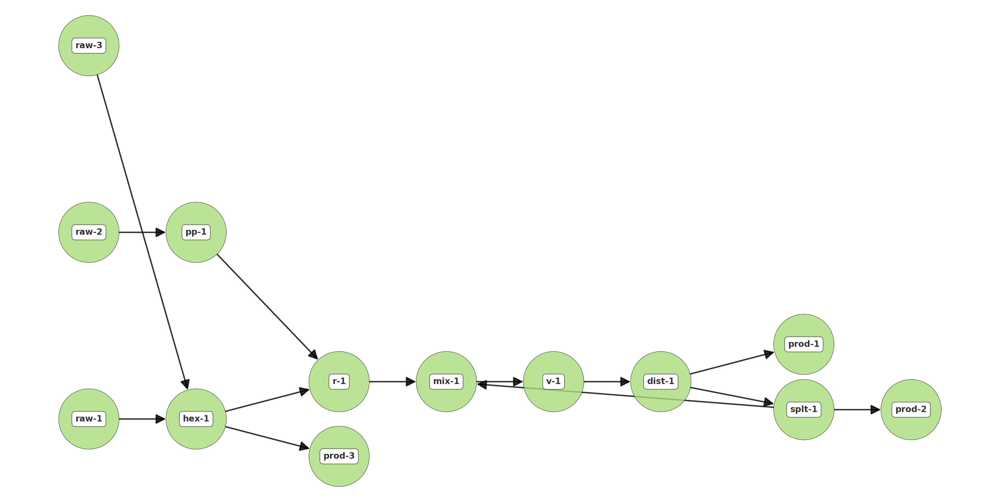

(<Figure size 3900x1950 with 1 Axes>, None, None)

In [45]:
# Save graph as flowsheet class object.
from Flowsheet_Class.flowsheet import Flowsheet

flowsheet_1=Flowsheet()
flowsheet_1.state=G
flowsheet_1.visualize_flowsheet(table=False, pfd_path="plots/flowsheet1", plot_with_stream_labels=False)


In [46]:
# Create SFILES from graph using the flowsheet class.
flowsheet_1.convert_to_sfiles(version="v2")
sfiles_1 = flowsheet_1.sfiles
print(sfiles_1)
flowsheet_1.create_from_sfiles(sfiles_1, overwrite_nx=True)
flowsheet_1.convert_to_sfiles(version="v2")
sfiles_2 = flowsheet_1.sfiles
print("Conversion from SFILES to graph and back to SFILES successful!\n" if sfiles_1 == sfiles_2
      else "Error encountered during conversion!")

(raw)(hex){1}(r)<&|(raw)(pp)&|(mix)<1(v)(dist)[{tout}(prod)]{bout}(splt)1(prod)n|(raw)(hex){1}(prod)
['(raw)', '(hex)', '{1}', '(r)', '<&|', '(raw)', '(pp)', '&|', '(mix)', '<1', '(v)', '(dist)', '[', '{tout}', '(prod)', ']', '{bout}', '(splt)', '1', '(prod)', 'n|', '(raw)', '(hex)', '{1}', '(prod)']
Conversion from SFILES to graph and back to SFILES successful!



# Real flowsheet examples (extracted from DWSIM simulation files)

In [47]:
from os import listdir
from os.path import isfile, join

all_files = {i:f for i,f in enumerate(listdir("Real_flowsheets/DWSim_pickle_files")) if isfile(join("Real_flowsheets/DWSim_pickle_files", f))}
all_images = {i:f for i,f in enumerate(listdir("Real_flowsheets/images")) if isfile(join("Real_flowsheets/images", f))}
    

In [48]:
import pickle

# Provide full path if not in current working directory
with open('Real_flowsheets/DWSim_pickle_files/DWSim_48_Ethyleneglycol.pkl', 'rb') as f:
    data = pickle.load(f)

print("Type of object:", type(data))
print("Contents:")
print(data)

nx.write_adjlist(data, "new_data.adjlist")

Type of object: <class 'networkx.classes.digraph.DiGraph'>
Contents:
DiGraph with 8 nodes and 7 edges


Number of unit operations = 5
Number of controllers = 3
Number of indicators = 0 
Number of transmitters = 0


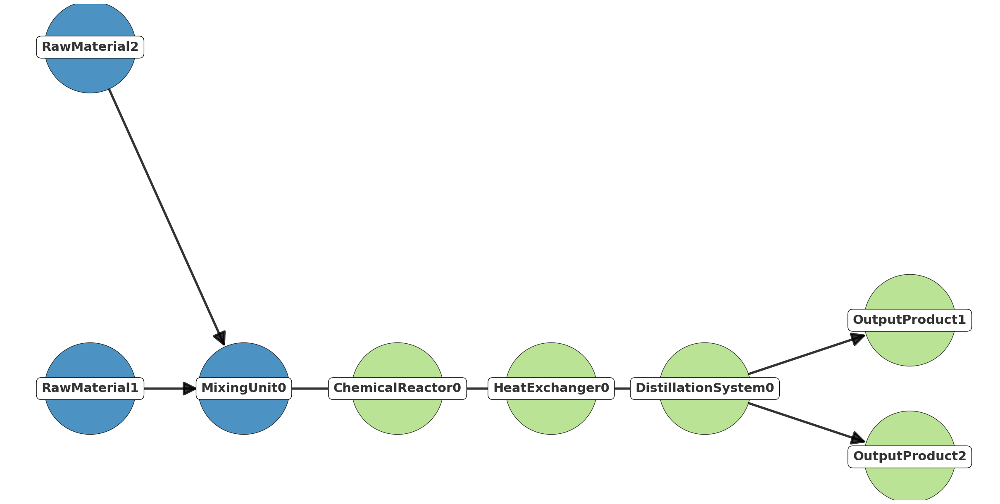

(<Figure size 2400x1200 with 1 Axes>, None, None)

In [49]:
# Save graph as flowsheet class object.
from Flowsheet_Class.flowsheet import Flowsheet

flowsheet_1=Flowsheet()
flowsheet_1.state=data
flowsheet_1.visualize_flowsheet(table=False, pfd_path="plots/flowsheet1", plot_with_stream_labels=False)

Number of unit operations = 12
Number of controllers = 9
Number of indicators = 0 
Number of transmitters = 0


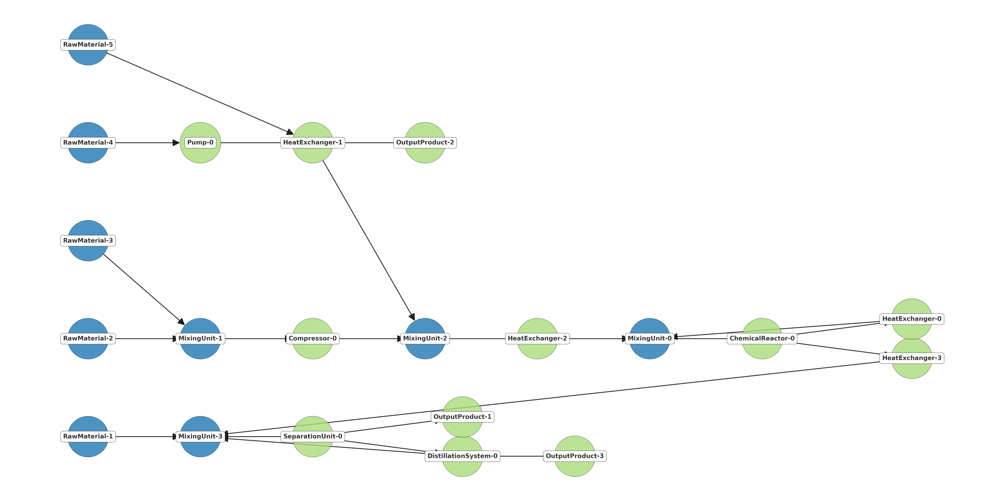

(raw)(pp)(hex){1}(mix)<&|(raw)(mix)<&|(raw)&|(comp)&|(hex)(mix)<1(r)[(hex)1](hex)(mix)<2<&|(raw)&|(sep)[{tout}(prod)]{bout}(dist){bout}2{tout}(prod)n|(raw)(hex){1}(prod)
['(raw)', '(pp)', '(hex)', '{1}', '(mix)', '<&|', '(raw)', '(mix)', '<&|', '(raw)', '&|', '(comp)', '&|', '(hex)', '(mix)', '<1', '(r)', '[', '(hex)', '1', ']', '(hex)', '(mix)', '<2', '<&|', '(raw)', '&|', '(sep)', '[', '{tout}', '(prod)', ']', '{bout}', '(dist)', '{bout}', '2', '{tout}', '(prod)', 'n|', '(raw)', '(hex)', '{1}', '(prod)']
0: Conversion from SFILES to graph and back to SFILES successful!
Number of unit operations = 5
Number of controllers = 3
Number of indicators = 0 
Number of transmitters = 0


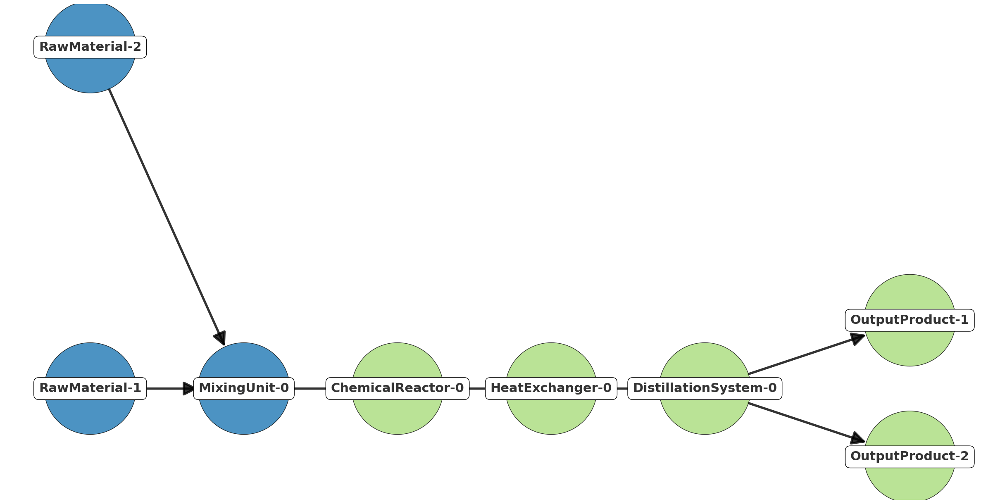

(raw)(mix)<&|(raw)&|(r)(hex)(dist)[{bout}(prod)]{tout}(prod)
['(raw)', '(mix)', '<&|', '(raw)', '&|', '(r)', '(hex)', '(dist)', '[', '{bout}', '(prod)', ']', '{tout}', '(prod)']
1: Conversion from SFILES to graph and back to SFILES successful!
Number of unit operations = 16
Number of controllers = 6
Number of indicators = 0 
Number of transmitters = 0


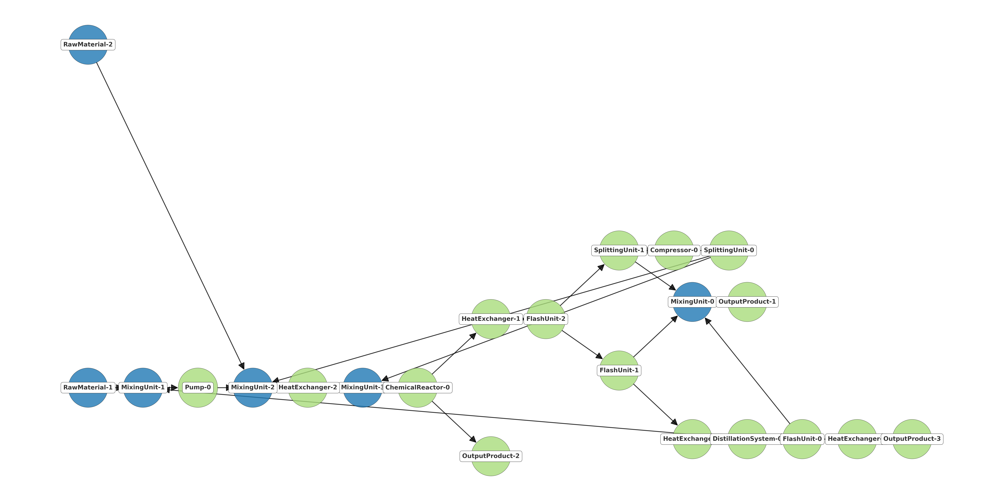

(raw)(mix)<1(pp)(mix)<5<&|(raw)&|(hex)(mix)<4(r)[(prod)](hex)(flash)[{bout}(flash){tout}2[{bout}(hex)(dist){bout}1{tout}(flash)[{bout}(hex)(prod)]{tout}(mix)<2<3(prod)]]{tout}(splt)3(comp)(splt)45
['(raw)', '(mix)', '<1', '(pp)', '(mix)', '<5', '<&|', '(raw)', '&|', '(hex)', '(mix)', '<4', '(r)', '[', '(prod)', ']', '(hex)', '(flash)', '[', '{bout}', '(flash)', '{tout}', '2', '[', '{bout}', '(hex)', '(dist)', '{bout}', '1', '{tout}', '(flash)', '[', '{bout}', '(hex)', '(prod)', ']', '{tout}', '(mix)', '<2', '<3', '(prod)', ']', ']', '{tout}', '(splt)', '3', '(comp)', '(splt)', '4', '5']
2: Conversion from SFILES to graph and back to SFILES successful!
Number of unit operations = 20
Number of controllers = 3
Number of indicators = 0 
Number of transmitters = 0


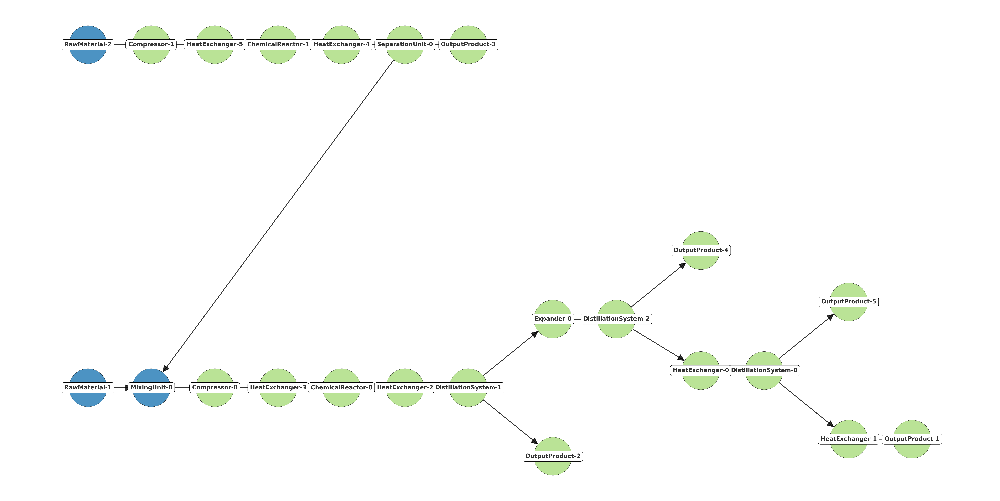

(raw)(comp)(hex)(r)(hex)(sep)[{tout}(prod)]{bout}(mix)<&|(raw)&|(comp)(hex)(r)(hex)(dist)[{tout}(prod)]{bout}(turb)(dist)[{tout}(prod)]{bout}(hex)(dist)[{tout}(prod)]{bout}(hex)(prod)
['(raw)', '(comp)', '(hex)', '(r)', '(hex)', '(sep)', '[', '{tout}', '(prod)', ']', '{bout}', '(mix)', '<&|', '(raw)', '&|', '(comp)', '(hex)', '(r)', '(hex)', '(dist)', '[', '{tout}', '(prod)', ']', '{bout}', '(turb)', '(dist)', '[', '{tout}', '(prod)', ']', '{bout}', '(hex)', '(dist)', '[', '{tout}', '(prod)', ']', '{bout}', '(hex)', '(prod)']
3: Conversion from SFILES to graph and back to SFILES successful!
Number of unit operations = 11
Number of controllers = 4
Number of indicators = 0 
Number of transmitters = 0


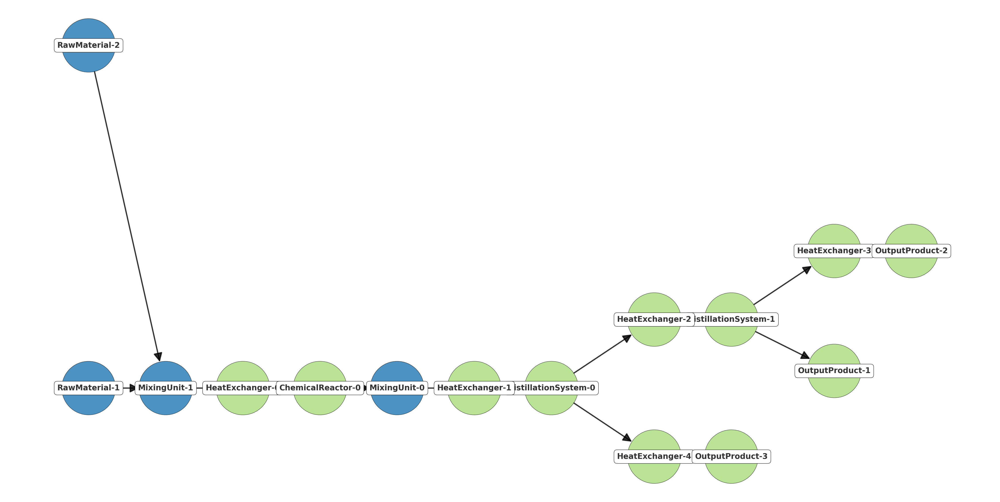

(raw)(mix)<&|(raw)&|(hex)(r)(mix)(hex)(dist)[{bout}(hex)(prod)]{tout}(hex)(dist)[{tout}(prod)]{bout}(hex)(prod)
['(raw)', '(mix)', '<&|', '(raw)', '&|', '(hex)', '(r)', '(mix)', '(hex)', '(dist)', '[', '{bout}', '(hex)', '(prod)', ']', '{tout}', '(hex)', '(dist)', '[', '{tout}', '(prod)', ']', '{bout}', '(hex)', '(prod)']
4: Conversion from SFILES to graph and back to SFILES successful!
Number of unit operations = 20
Number of controllers = 3
Number of indicators = 0 
Number of transmitters = 0


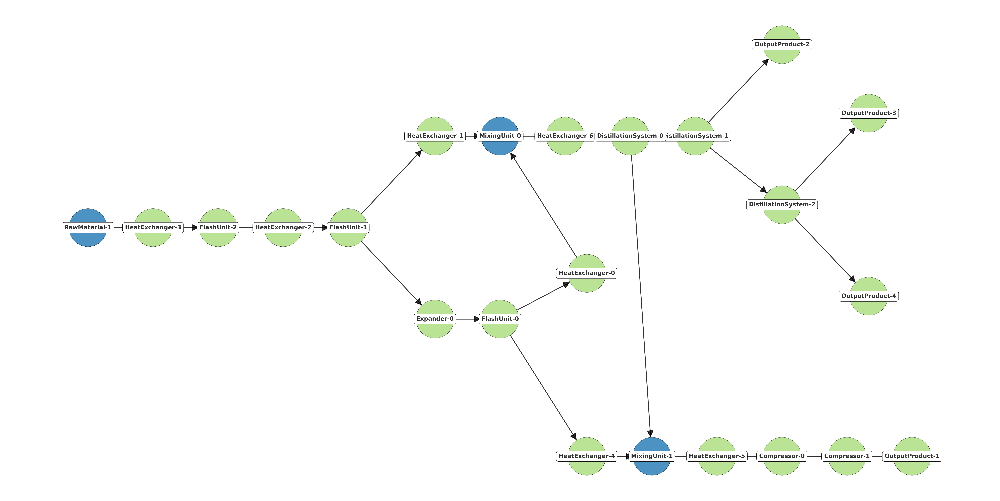

(raw)(hex)(flash){tout}(hex)(flash)[{tout}(turb)(flash)[{bout}(hex)(mix)<2(hex)(dist)[{bout}(dist)[{tout}(prod)]{bout}(dist)[{bout}(prod)]{tout}(prod)]{tout}(mix)<1(hex)(comp)(comp)(prod)]{tout}(hex)1]{bout}(hex)2
['(raw)', '(hex)', '(flash)', '{tout}', '(hex)', '(flash)', '[', '{tout}', '(turb)', '(flash)', '[', '{bout}', '(hex)', '(mix)', '<2', '(hex)', '(dist)', '[', '{bout}', '(dist)', '[', '{tout}', '(prod)', ']', '{bout}', '(dist)', '[', '{bout}', '(prod)', ']', '{tout}', '(prod)', ']', '{tout}', '(mix)', '<1', '(hex)', '(comp)', '(comp)', '(prod)', ']', '{tout}', '(hex)', '1', ']', '{bout}', '(hex)', '2']
5: Conversion from SFILES to graph and back to SFILES successful!
Number of unit operations = 14
Number of controllers = 1
Number of indicators = 0 
Number of transmitters = 0


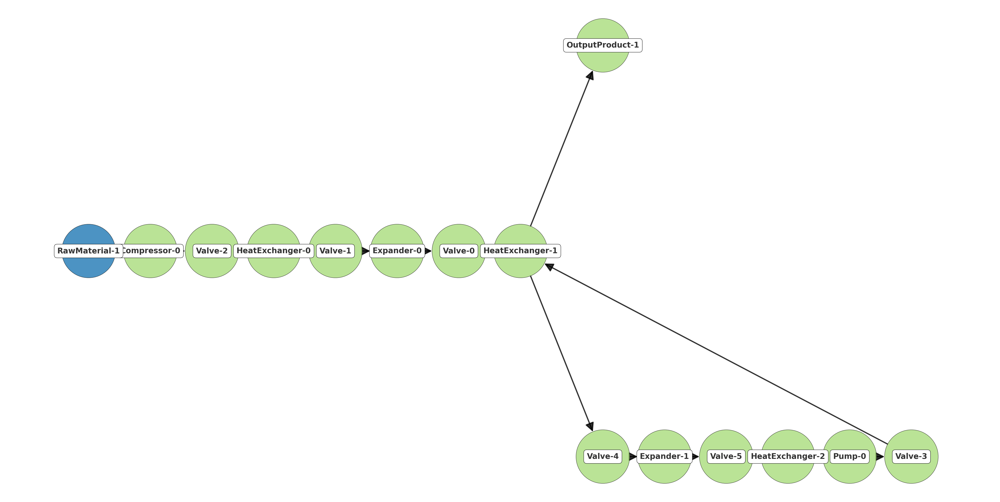

(raw)(comp)(v)(hex)(v)(turb)(v)(hex){1}(prod)n|(turb)<1(v)(hex)(pp)(v)(hex){1}(v)1
['(raw)', '(comp)', '(v)', '(hex)', '(v)', '(turb)', '(v)', '(hex)', '{1}', '(prod)', 'n|', '(turb)', '<1', '(v)', '(hex)', '(pp)', '(v)', '(hex)', '{1}', '(v)', '1']
6: Conversion from SFILES to graph and back to SFILES successful!
Number of unit operations = 5
Number of controllers = 1
Number of indicators = 0 
Number of transmitters = 0


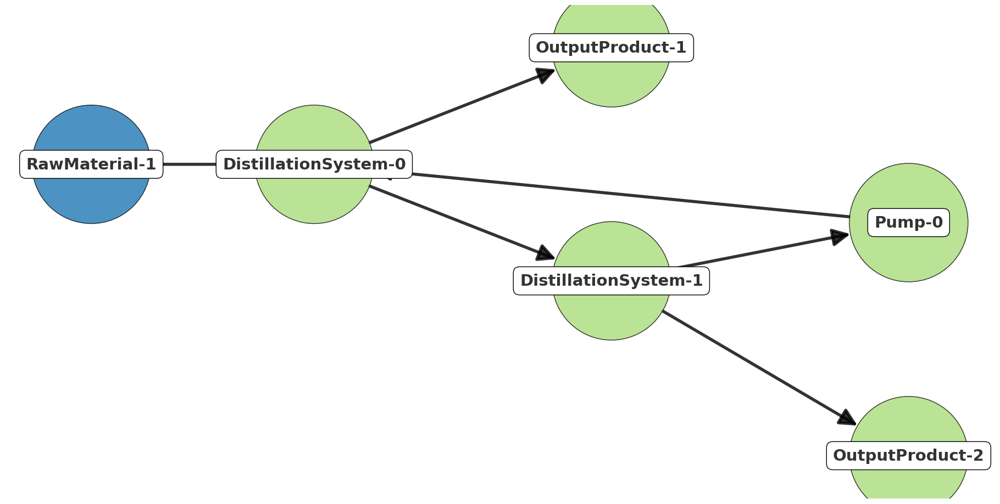

(raw)(dist)<1[{bout}(prod)]{tout}(dist)[{bout}(prod)]{tout}(pp)1
['(raw)', '(dist)', '<1', '[', '{bout}', '(prod)', ']', '{tout}', '(dist)', '[', '{bout}', '(prod)', ']', '{tout}', '(pp)', '1']
7: Conversion from SFILES to graph and back to SFILES successful!
Number of unit operations = 19
Number of controllers = 8
Number of indicators = 0 
Number of transmitters = 0


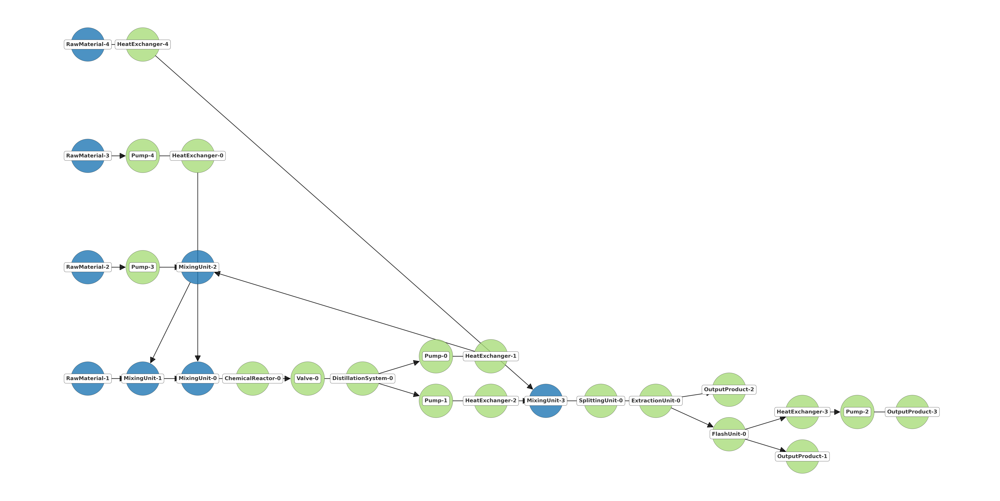

(raw)(pp)(hex)(mix)<1(r)(v)(dist)[{bout}(pp)(hex)(mix)<&|(raw)(hex)&|(splt){bin}(extr)[{tout}(prod)]{bout}(flash)[{tout}(prod)]{bout}(hex)(pp)(prod)]{tout}(pp)(hex)(mix)<&|(raw)(pp)&|(mix)1<&|(raw)&|
['(raw)', '(pp)', '(hex)', '(mix)', '<1', '(r)', '(v)', '(dist)', '[', '{bout}', '(pp)', '(hex)', '(mix)', '<&|', '(raw)', '(hex)', '&|', '(splt)', '{bin}', '(extr)', '[', '{tout}', '(prod)', ']', '{bout}', '(flash)', '[', '{tout}', '(prod)', ']', '{bout}', '(hex)', '(pp)', '(prod)', ']', '{tout}', '(pp)', '(hex)', '(mix)', '<&|', '(raw)', '(pp)', '&|', '(mix)', '1', '<&|', '(raw)', '&|']
8: Conversion from SFILES to graph and back to SFILES successful!


In [50]:
import pickle
import re

all_sfiles = {}
for i,f in all_files.items():
    # Read pickle files and restructure names.
    with open(join("Real_flowsheets/DWSim_pickle_files", f), "rb") as f:
        G = pickle.load(f)
    _node_names = list(G.nodes)
    relabel_mapping = {}
    for n in _node_names:
        r = re.compile("([a-zA-Z]+)([0-9]+)")
        _full_name = r.match(n).groups()
        _name = _full_name[0]  # Name without number
        _num = _full_name[1]
        relabel_mapping[n] = _name +"-"+ _num
    G = nx.relabel_nodes(G, relabel_mapping)

    # Load graph as flowsheet class object
    flowsheet = Flowsheet(OntoCapeConformity=True)
    flowsheet.state = G
    #visualize
    
    flowsheet.visualize_flowsheet(table=False, pfd_path="plots/flowsheet1", plot_with_stream_labels=False)

    # Convert to sfiles (+ -> graph -> sfiles)
    
    flowsheet.convert_to_sfiles(version="v2", remove_hex_tags=True)
    sfiles_1 = flowsheet.sfiles
    print(sfiles_1)
    all_sfiles[i]=sfiles_1
    flowsheet.create_from_sfiles(overwrite_nx=True, merge_HI_nodes=False)
    flowsheet.convert_to_sfiles(version="v2", remove_hex_tags=True)
    sfiles_2 = flowsheet.sfiles
    #print(sfiles_1)
    print("%i: Conversion from SFILES to graph and back to SFILES successful!" % i if sfiles_1 == sfiles_2
      else "%iError encountered during conversion!" % i)
    

## Flowsheet images and SFILES 2.0 from simulation files

Comments:
- Initial node for flowsheet graph traversal (first raw node in SFILES 2.0 string) is marked red in image.
- Example Natural gas processing: First flash bottom outlet was zero in simulation file and is not stored as prod node
in graph
- Modify i in range [0,8] to look at 9 different examples

maleic_anhydride
(raw)(pp)(hex){1}(mix)<&|(raw)(mix)<&|(raw)&|(comp)&|(hex)(mix)<1(r)[(hex)1](hex)(mix)<2<&|(raw)&|(sep)[{tout}(prod)]{bout}(dist){bout}2{tout}(prod)n|(raw)(hex){1}(prod)


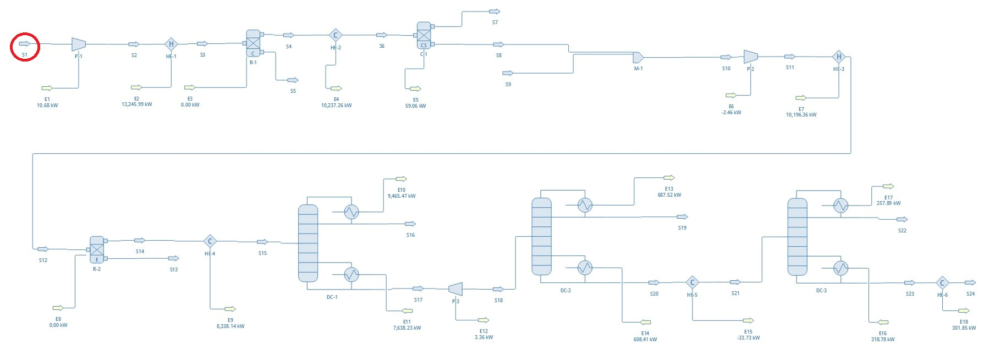

In [51]:
i=0
# Name
print("_".join(all_files[i].split(sep="_")[2:]).split(sep=".")[0])
# SFILES
print(all_sfiles[i])
# Image
Image(filename=join("Real_flowsheets/images",all_images[i]))

Process_Flowsheet_DMF
(raw)(comp)(hex)(r)(hex)(sep)[{tout}(prod)]{bout}(mix)<&|(raw)&|(comp)(hex)(r)(hex)(dist)[{tout}(prod)]{bout}(turb)(dist)[{tout}(prod)]{bout}(hex)(dist)[{tout}(prod)]{bout}(hex)(prod)


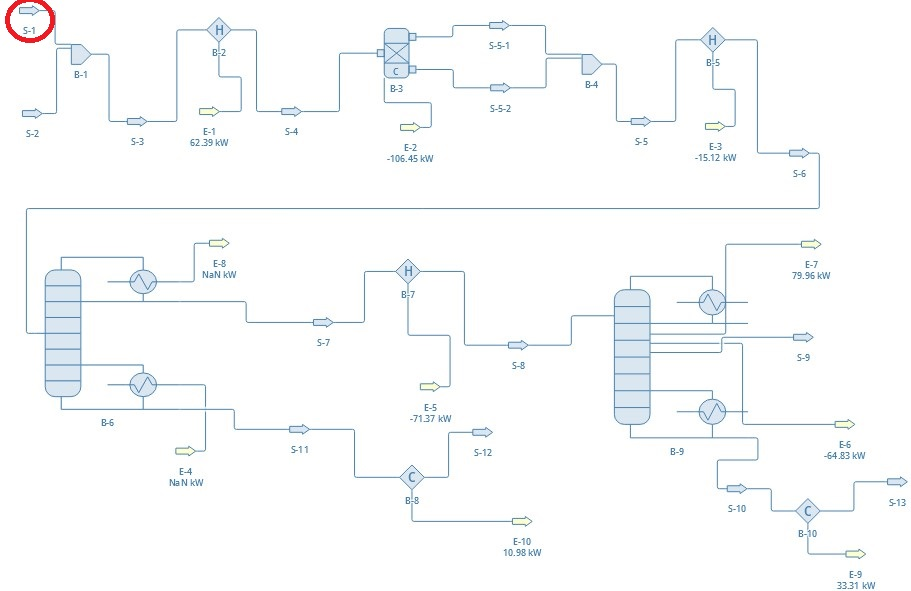

In [52]:
i=3
# Name
print("_".join(all_files[i].split(sep="_")[2:]).split(sep=".")[0])
# SFILES
print(all_sfiles[i])
# Image
Image(filename=join("Real_flowsheets/images",all_images[i]))

# Example including control structure

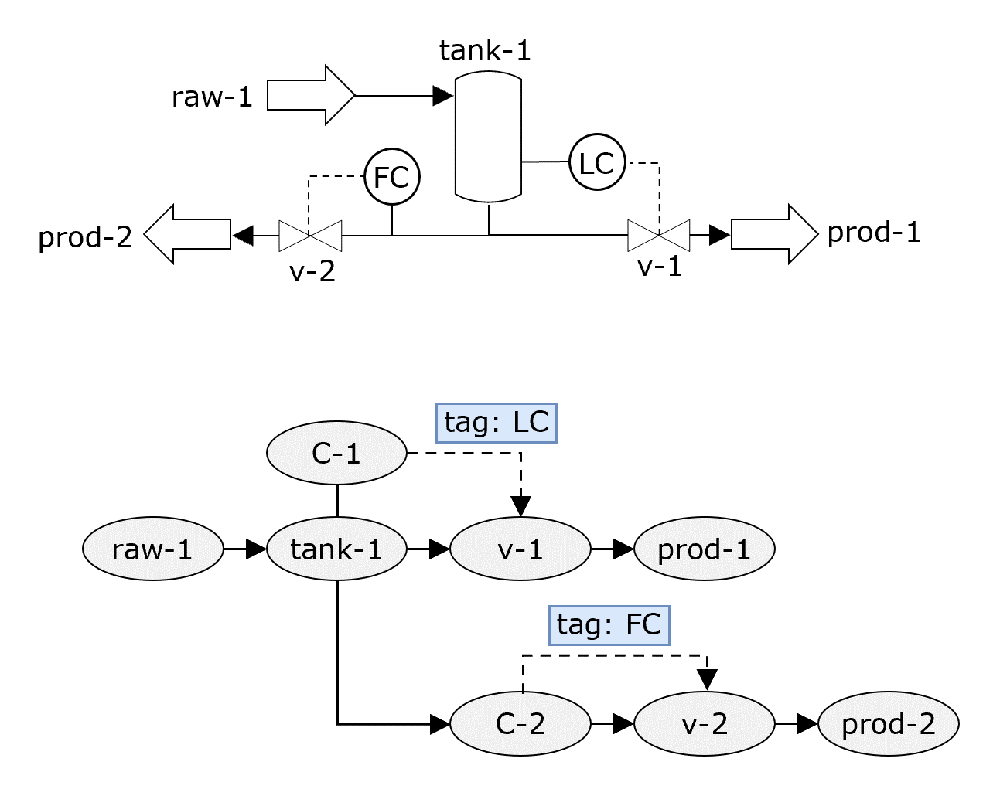

In [53]:
from IPython.display import Image

Image(filename="examples/SFILESctrl_example.png")

Comments:
- Edges are added to networx graph.
- The letter code of the control instruments is contained in their node name, e.g.,
C-1/TIC.
- Signal connections/edges are indicated by the tag 'signal' in 'tags'. Since networkx DiGraph does not allow multiple
connection between two nodes in the same direction, these nodes are distinguished by the attribute of 'signal'.
- Signal connections leading directly to the next unitoperation, are tagged with 'next_unitop'. In the example, this is
the case for the connection between C-2/FC and v-2. Here, material stream and signal edge are in
- Every other signal connection is tagged with 'not_next_unitop'.

In [54]:
import networkx as nx

G = nx.DiGraph()
G.add_edges_from([
    ("raw-1", "tank-1"), 
    ("tank-1", "C-1/LC"), 
    ("tank-1", "v-1"), 
    ("v-1", "prod-1"), 
    ("tank-1", "C-2/FC"),
    ("C-2/FC", "v-2", {"tags":{"signal": ["next_unitop"]}}), 
    ("v-2", "prod-2"),
    ("C-1/LC", "v-1", {"tags":{"signal": ["not_next_unitop"]}})
    ])


In [55]:
# Save graph as flowsheet class object.
from Flowsheet_Class.flowsheet import Flowsheet

flowsheet_ctrl = Flowsheet()
flowsheet_ctrl.state = G

# Create SFILES from graph using the flowsheet class.
flowsheet_ctrl.convert_to_sfiles(version="v2")
sfiles_1 = flowsheet_ctrl.sfiles
print(sfiles_1)
flowsheet_ctrl.create_from_sfiles(sfiles_1, overwrite_nx=True)
flowsheet_ctrl.convert_to_sfiles(version="v2")
sfiles_2 = flowsheet_ctrl.sfiles
print("Conversion from SFILES to graph and back to SFILES successful!" if sfiles_1 == sfiles_2
      else "Error encountered during conversion!")


(raw)(tank)[(C){LC}_1][(v)<_1(prod)](C){FC}_2(v)<_2(prod)
['(raw)', '(tank)', '[', '(C)', '{LC}', '_1', ']', '[', '(v)', '<_1', '(prod)', ']', '(C)', '{FC}', '_2', '(v)', '<_2', '(prod)']
Conversion from SFILES to graph and back to SFILES successful!


Number of unit operations = 6
Number of controllers = 2
Number of indicators = 0 
Number of transmitters = 0


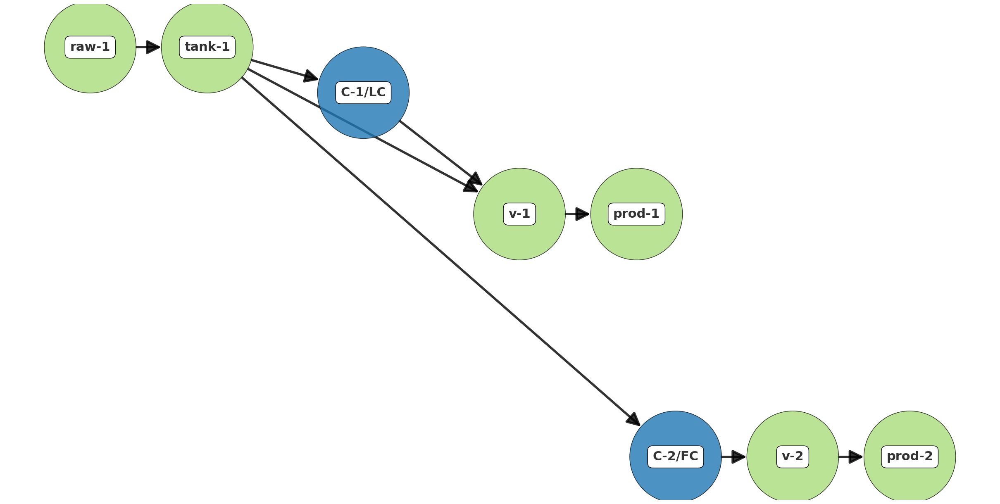

(<Figure size 2400x1200 with 1 Axes>, None, None)

In [56]:

flowsheet_ctrl.visualize_flowsheet(table=False, pfd_path="plots/flowsheet1", plot_with_stream_labels=False)

# convert SFILES to flowsheet
- taken a sfile notation
- convert it to flowsheet

### without controller

In [57]:
from Flowsheet_Class.flowsheet import Flowsheet

G = nx.DiGraph()
flowsheet_c = Flowsheet()
flowsheet_c.state = G


sfiles_1 = "(raw)(v)(tank)(comp)(v)(r)<&|(raw)(hex){1}(hex)(mix)<&|(raw)(v)&|(mix)&<&|(raw)(v)&||(v)(prod)n|(raw)(v)(hex){1}(prod)"
print(sfiles_1)
flowsheet_c.create_from_sfiles(sfiles_1, overwrite_nx=True)
flowsheet_c.convert_to_sfiles(version="v2")
sfiles_2 = flowsheet_c.sfiles
print("Conversion from SFILES to graph and back to SFILES successful!" if sfiles_1 == sfiles_2
      else "Error encountered during conversion!")


(raw)(v)(tank)(comp)(v)(r)<&|(raw)(hex){1}(hex)(mix)<&|(raw)(v)&|(mix)&<&|(raw)(v)&||(v)(prod)n|(raw)(v)(hex){1}(prod)
['(raw)', '(v)', '(tank)', '(comp)', '(v)', '(r)', '<&|', '(raw)', '(hex)', '{1}', '(hex)', '(mix)', '<&|', '(raw)', '(v)', '&|', '(mix)', '&', '<&|', '(raw)', '(v)', '&|', '|', '(v)', '(prod)', 'n|', '(raw)', '(v)', '(hex)', '{1}', '(prod)']
Conversion from SFILES to graph and back to SFILES successful!


Number of unit operations = 21
Number of controllers = 0
Number of indicators = 0 
Number of transmitters = 0


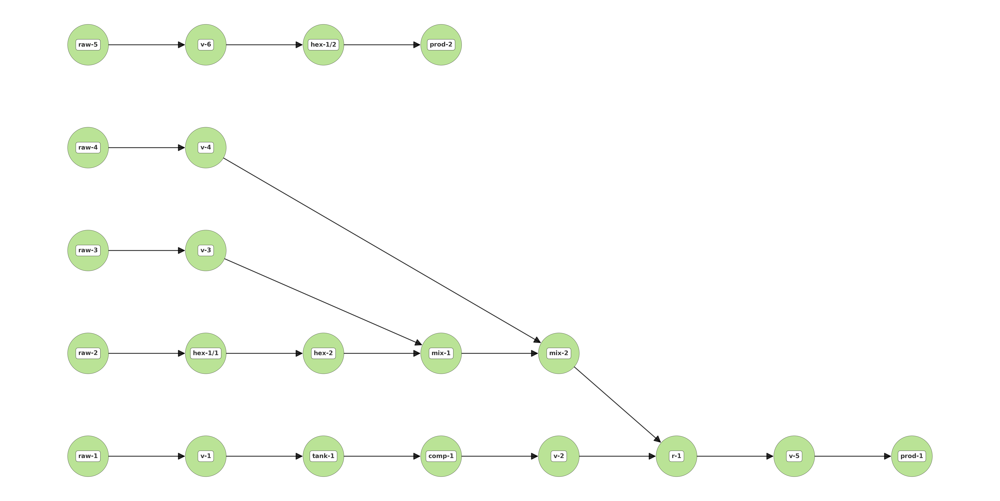

(<Figure size 6300x3150 with 1 Axes>, None, None)

In [58]:

flowsheet_c.visualize_flowsheet(table=False, pfd_path="plots/flowsheet1", plot_with_stream_labels=False)

### with controller

In [59]:
from Flowsheet_Class.flowsheet import Flowsheet


G = nx.DiGraph()

flowsheet_c = Flowsheet()
flowsheet_c.state = G


sfiles_1 = "(raw)(C){FC}_1(v)<_1(hex){1}(C){TC}_2(rect)<1<4[(C){PC}_3][(C){LC}_4][(C){TC}_5][{tout}(cond)(sep)[(C){LC}_6][(v)<_3(prod)](splt)[(v)<_6(hex){2}(C){TC}_7(prod)](C){FC}_8(v)1<_8]{bout}(splt)[(C){FC}_9<_5(v)<_9(C){FC}_10(v)<_10(hex){3}(C){TC}_11(rect)<2<3[(C){PC}_12][(C){LC}_13][{tout}(cond)(sep)[(C){LC}_14][(v)<_12(prod)](splt)[(C){FC}_15(v)<_15(hex){4}(C){TC}_16(prod)](v)2<_14]{bout}(splt)[(v)<_13(prod)](hex){5}3](hex){6}4n|(raw)(splt)[(hex){2}(mix)<5(prod)](v)5<_7n|(raw)(splt)[(hex){4}(mix)<6(prod)](v)6<_16n|(raw)(C){FC}_17(v)<_17(hex){5}(prod)n|(raw)(v)<_2(hex){1}(prod)n|(raw)(v)<_4(hex){6}(prod)n|(raw)(v)<_11(hex){3}(prod)"
print(sfiles_1)
flowsheet_c.create_from_sfiles(sfiles_1, overwrite_nx=True)
flowsheet_c.convert_to_sfiles(version="v2")
sfiles_2 = flowsheet_c.sfiles
print("Conversion from SFILES to graph and back to SFILES successful!" if sfiles_1 == sfiles_2
      else "Error encountered during conversion!")


(raw)(C){FC}_1(v)<_1(hex){1}(C){TC}_2(rect)<1<4[(C){PC}_3][(C){LC}_4][(C){TC}_5][{tout}(cond)(sep)[(C){LC}_6][(v)<_3(prod)](splt)[(v)<_6(hex){2}(C){TC}_7(prod)](C){FC}_8(v)1<_8]{bout}(splt)[(C){FC}_9<_5(v)<_9(C){FC}_10(v)<_10(hex){3}(C){TC}_11(rect)<2<3[(C){PC}_12][(C){LC}_13][{tout}(cond)(sep)[(C){LC}_14][(v)<_12(prod)](splt)[(C){FC}_15(v)<_15(hex){4}(C){TC}_16(prod)](v)2<_14]{bout}(splt)[(v)<_13(prod)](hex){5}3](hex){6}4n|(raw)(splt)[(hex){2}(mix)<5(prod)](v)5<_7n|(raw)(splt)[(hex){4}(mix)<6(prod)](v)6<_16n|(raw)(C){FC}_17(v)<_17(hex){5}(prod)n|(raw)(v)<_2(hex){1}(prod)n|(raw)(v)<_4(hex){6}(prod)n|(raw)(v)<_11(hex){3}(prod)
['(raw)', '(C)', '{FC}', '_1', '(v)', '<_1', '(hex)', '{1}', '(C)', '{TC}', '_2', '(rect)', '<1', '<4', '[', '(C)', '{PC}', '_3', ']', '[', '(C)', '{LC}', '_4', ']', '[', '(C)', '{TC}', '_5', ']', '[', '{tout}', '(cond)', '(sep)', '[', '(C)', '{LC}', '_6', ']', '[', '(v)', '<_3', '(prod)', ']', '(splt)', '[', '(v)', '<_6', '(hex)', '{2}', '(C)', '{TC}', '_7', '(pr

In [60]:

flowsheet_c.visualize_flowsheet(table=False, pfd_path="plots/flowsheet1", plot_with_stream_labels=False,plot_as_pfd=False)

Number of unit operations = 60
Number of controllers = 17
Number of indicators = 0 
Number of transmitters = 0


(<Figure size 23100x11550 with 1 Axes>, None, None)

# Pickle File

In [61]:
import pickle


with open('Real_flowsheets/DWSim_pickle_files/DWSim_48_Ethyleneglycol.pkl', 'rb') as f:
    data = pickle.load(f)

print("Type of object:", type(data))
print("Contents:")
print(data)


with open('DWSIM_files/fstest.xml') as f:
    pfdx_data = f.read()

print("Type of object:", type(pfdx_data))
print("Contents:")
print(pfdx_data) 


Type of object: <class 'networkx.classes.digraph.DiGraph'>
Contents:
DiGraph with 8 nodes and 7 edges
Type of object: <class 'str'>
Contents:
﻿<?xml version="1.0" encoding="utf-8"?>
<DWSIM_Simulation_Data>
  <GeneralInfo>
    <BuildVersion>9.0.2.0</BuildVersion>
    <BuildDate>2000-01-03T00:00:00</BuildDate>
    <OSInfo>Microsoft Windows 11 Pro, Version 10.0.26100.0, Win32NT Platform</OSInfo>
    <SavedOn>2025-06-10T13:48:39.9042134+05:30</SavedOn>
  </GeneralInfo>
  <GraphicObjects>
    <GraphicObject>
      <Type>PortableFlowsheetDrawing.GraphicObjects.Shapes.MaterialStreamGraphic</Type>
      <SemiTransparent>false</SemiTransparent>
      <LineWidth>1</LineWidth>
      <GradientMode>true</GradientMode>
      <LineColor>#ff4682b4</LineColor>
      <LineColorDark>#fff5f5f5</LineColorDark>
      <Fill>false</Fill>
      <FillColor>#ffffffff</FillColor>
      <FillColorDark>#ffffffff</FillColorDark>
      <GradientColor1>#ffd3d3d3</GradientColor1>
      <GradientColor2>#ffffffff</Gradie

In [62]:
from Flowsheet_Class.flowsheet import Flowsheet

flowsheet_test = Flowsheet(xml_file='DWSIM_files/fstest.xml')
#flowsheet_test.visualize_flowsheet(table=False, pfd_path="plots/flowsheet1", plot_with_stream_labels=False)


NetworkXError: file not successfully read as graphml

In [ ]:
import pickle
import re

all_sfiles = {}
for i,f in all_files.items():
    # Read pickle files and restructure names.
    with open(join("Real_flowsheets/DWSim_pickle_files", f), "rb") as f:
        G = pickle.load(f)
    _node_names = list(G.nodes)
    relabel_mapping = {}
    for n in _node_names:
        r = re.compile("([a-zA-Z]+)([0-9]+)")
        _full_name = r.match(n).groups()
        _name = _full_name[0]  # Name without number
        _num = _full_name[1]
        relabel_mapping[n] = _name +"-"+ _num
    G = nx.relabel_nodes(G, relabel_mapping)

    # Load graph as flowsheet class object
    flowsheet = Flowsheet(OntoCapeConformity=True)
    flowsheet.state = G
    #visualize
    
    flowsheet.visualize_flowsheet(table=False, pfd_path="plots/flowsheet1", plot_with_stream_labels=False)

    # Convert to sfiles (+ -> graph -> sfiles)
    
    flowsheet.convert_to_sfiles(version="v2", remove_hex_tags=True)
    sfiles_1 = flowsheet.sfiles
    print(sfiles_1)
    all_sfiles[i]=sfiles_1
    flowsheet.create_from_sfiles(overwrite_nx=True, merge_HI_nodes=False)
    flowsheet.convert_to_sfiles(version="v2", remove_hex_tags=True)
    sfiles_2 = flowsheet.sfiles
    #print(sfiles_1)
    print("%i: Conversion from SFILES to graph and back to SFILES successful!" % i if sfiles_1 == sfiles_2
      else "%iError encountered during conversion!" % i)
    

NameError: name 'all_files' is not defined

In [ ]:
import xml.etree.ElementTree as ET
import pickle

# Parse the XML file
tree = ET.parse('test/unzipped/3b7d4439-48e7-4d41-9ea9-b17b1d5e269a.xml')
root = tree.getroot()

# Convert XML elements into a dictionary (simple flat example)
data = {child.tag: child.text for child in root}

# Save the dictionary as a pickle file
with open('test/output.pkl', 'wb') as f:
    pickle.dump(data, f)

# Load the pickle file
with open('test/output.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

print("Type of object:", type(loaded_data))
print("Contents:")
print(loaded_data)


FileNotFoundError: [Errno 2] No such file or directory: 'test/unzipped/3b7d4439-48e7-4d41-9ea9-b17b1d5e269a.xml'

In [ ]:
import xml.etree.ElementTree as ET
import networkx as nx

def pfdx_to_networkx(pfdx_path):
    """Convert DWSIM PFDX to NetworkX DiGraph"""
    tree = ET.parse(pfdx_path)
    root = tree.getroot()
    
    G = nx.DiGraph()
    
    # Add unit operations as nodes
    for unit in root.findall('.//UnitOperations/*'):
        G.add_node(unit.get('ID'), type=unit.tag, **unit.attrib)
    
    # Add streams as edges with attributes
    for stream in root.findall('.//Streams/Stream'):
        G.add_edge(stream.get('Source'), 
                   stream.get('Destination'),
                   **{k: float(v) for k,v in stream.attrib.items() if k != 'Source' and k != 'Destination'})
    
    return G
def save_as_pickle(G, output_path):
    """Save NetworkX graph using optimized pickle protocol"""
    nx.write_gpickle(G, output_path, protocol=4)  # For Python 3.4+
    
# Usage
process_graph = pfdx_to_networkx("test/test3.pfdx")
save_as_pickle(process_graph, "process_graph.pkl")


FileNotFoundError: [Errno 2] No such file or directory: 'test/test3.pfdx'

In [ ]:
import networkx as nx
G = nx.Graph()
nx.read_graphml("test/unzipped/3b7d4439-48e7-4d41-9ea9-b17b1d5e269a.xml")


FileNotFoundError: [Errno 2] No such file or directory: 'test/unzipped/3b7d4439-48e7-4d41-9ea9-b17b1d5e269a.xml'

In [ ]:
def validate_pickle(pkl_path):
    """Verify graph integrity after conversion"""
    G = nx.read_gpickle(pkl_path)
    
    print(f"Graph contains {len(G.nodes)} unit operations")
    print(f"Graph contains {len(G.edges)} material streams")
    print("Sample edge data:", list(G.edges(data=True))[0])


: 